**SOCIO-ECONOMIC ANALYSIS AT COUNTY LEVEL IN THE UNITED STATES FOR THE YEAR 2024**

##**Introduction:**


Health and socioeconomic disparities in the United States have long been subjects of public concern and policy discussions. Counties across the country exhibit substantial variations in life expectancy, disease prevalence, access to healthcare, and economic stability, making it imperative to investigate the underlying factors contributing to these differences.

This project integrates data from multiple sources, including health statistics, economic conditions, environmental measures, and social behaviors, to form a multi-faceted view of community well-being. Specifically, our study seeks to address the following key questions:

1. How do economic factors like income, unemployment, and housing costs affect health outcomes?

2. What role does environmental pollution play in determining health conditions at the county level?

3. Is there a significant link between intoxication-related behaviors (smoking, drinking, drug use) and mortality rates?

4. Which states and counties exhibit the highest disparities in health and economic conditions?


To answer these questions, we perform extensive data preprocessing, correlation analysis, statistical modeling, and visualization. The project aims to not only describe existing disparities but also provide actionable insights for improving public health through evidence-based decision-making.

By leveraging data analytics and visualization techniques, this study will facilitate better understanding of risk factors at a granular level, guiding targeted interventions and policy reforms.

##**Plan of action:**

1. Load the data from the below link and change the data sheets into different excel files:
https://www.countyhealthrankings.org/sites/default/files/media/document/2024_county_health_release_data_-_v1.xlsx

2. Clean the data, select the columns which are necessary for our analysis

3. Extract descriptive statistics and Visualize few interesting details from the data sets and interpret them.

4. Create different categories and merge all the columns belonging to a particular category into one dataframe: Health, Economic, Socio-Demographic, Environmental and Intoxication.

5. Visualize each category in detail and interpret the findings

6. Find the shapefile for all counties in the USA and merge with the present data set

7. Plot the selected variables (2/more) on the map using geopandas

8. Perform Clustering for high risk counties

9. Consider Health category, find the available health care and analyse the healthcare accessibility vs Travel distance

10. Merge the data for Cost of healthcare and insurance and analyse

11. Consider Socio-economics category and analyse Housing and rental affordability

12. Merge the data for Crime rate per county and Understand the impact of homelessness on the crime rate

In [ ]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import os
import geopandas as gpd
import folium
from IPython.display import display
import ipywidgets as widgets
from ipywidgets import interactive_output, VBox, Dropdown
import branca.colormap as cm
import gdown
import time

In [ ]:
import pandas as pd
import geopandas as gpd
import gdown
import zipfile
import os

# Google Sheets direct export URLs
google_sheets_urls = {
    "select_measure_data": "https://docs.google.com/spreadsheets/d/13avvo-UcLcQfAKLldtHvZV19nT_hglwD/export?format=csv",
    "additional_measure_data": "https://docs.google.com/spreadsheets/d/1xcVIYgAf9XK929qGypQrVhSoS8HvFmjQ/export?format=csv"
}

# Google Drive file IDs mapped to ZIP files containing shapefiles
drive_file_ids = {
    "us_county": "1KlYOWUg4bYTDrDtDeLu9rpnczcxD1qZC",
    "us_state": "1KKiciA-oiVLag8Sr8N4iZqbUx4EyXc96"
}

# Load Google Sheets data
select_measure_data = pd.read_csv(google_sheets_urls["select_measure_data"])
additional_measure_data = pd.read_csv(google_sheets_urls["additional_measure_data"])

# Create a directory to store extracted files
extracted_dir = "extracted_data"
os.makedirs(extracted_dir, exist_ok=True)

# Dictionary to store shapefile paths
shapefile_paths = {}

# Download, extract, and find shapefiles
for name, file_id in drive_file_ids.items():
    zip_path = f"{name}.zip"
    extract_path = os.path.join(extracted_dir, name)

    # Download the ZIP file
    gdown.download(f"https://drive.google.com/uc?id={file_id}", zip_path, quiet=False)

    # Extract ZIP file
    os.makedirs(extract_path, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)

    # Find the shapefile inside the extracted folder
    shp_file = next(f for f in os.listdir(extract_path) if f.endswith(".shp"))
    shapefile_paths[name] = os.path.join(extract_path, shp_file)

# Load the shapefiles into GeoPandas DataFrames
us_county = gpd.read_file(shapefile_paths["us_county"])
us_state = gpd.read_file(shapefile_paths["us_state"])

# Display dataset samples
print(select_measure_data.head())
print(additional_measure_data.head())
print(us_county.head())
print(us_state.head())


Downloading...
From (original): https://drive.google.com/uc?id=1KlYOWUg4bYTDrDtDeLu9rpnczcxD1qZC
From (redirected): https://drive.google.com/uc?id=1KlYOWUg4bYTDrDtDeLu9rpnczcxD1qZC&confirm=t&uuid=1d37043f-f1e9-40b4-a7aa-4c92537b84e9
To: /content/us_county.zip
100%|██████████| 83.9M/83.9M [00:02<00:00, 39.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1KKiciA-oiVLag8Sr8N4iZqbUx4EyXc96
To: /content/us_state.zip
100%|██████████| 9.95M/9.95M [00:00<00:00, 70.5MB/s]


   FIPS    State   County  Life Expectancy  Age-Adjusted Death Rate  \
0  1000  Alabama      NaN             73.7                    549.0   
1  1001  Alabama  Autauga             75.3                    472.0   
2  1003  Alabama  Baldwin             76.7                    416.0   
3  1005  Alabama  Barbour             72.4                    628.0   
4  1007  Alabama     Bibb             72.3                    618.0   

   Child Mortality Rate  % Frequent Physical Distress  \
0                  73.0                          12.0   
1                  59.0                          12.0   
2                  54.0                          11.0   
3                  80.0                          16.0   
4                 101.0                          14.0   

   % Frequent Mental Distress  % Adults with Diabetes  HIV Prevalence Rate  \
0                        20.0                    13.0                340.0   
1                        18.0                    11.0                218.0

In [ ]:
# View the data
select_measure_data.head()

,FIPS,State,County,Life Expectancy,Age-Adjusted Death Rate,Child Mortality Rate,% Frequent Physical Distress,% Frequent Mental Distress,% Adults with Diabetes,HIV Prevalence Rate,...,% 65 and Over,% Black,% American Indian or Alaska Native,% Asian,% Native Hawaiian or Other Pacific Islander,% Hispanic,% Non-Hispanic White,% Not Proficient in English,% Female,% Rural
0,1000,Alabama,NaN,73.7,549.0,73.0,12.0,20.0,13.0,340.0,...,18.0,26.4,0.7,1.6,0.1,4.9,64.7,1.0,51.4,42.3
1,1001,Alabama,Autauga,75.3,472.0,59.0,12.0,18.0,11.0,218.0,...,16.4,21.0,0.5,1.2,0.1,3.4,72.1,0.0,51.3,40.7
2,1003,Alabama,Baldwin,76.7,416.0,54.0,11.0,17.0,10.0,174.0,...,21.9,8.2,0.8,1.2,0.1,5.0,83.0,1.0,51.2,37.6
3,1005,Alabama,Barbour,72.4,628.0,80.0,16.0,21.0,16.0,514.0,...,20.6,47.2,0.7,0.5,0.3,5.1,45.3,2.0,47.1,65.9
4,1007,Alabama,Bibb,72.3,618.0,101.0,14.0,19.0,12.0,269.0,...,17.8,20.7,0.6,0.3,0.1,3.2,74.0,0.0,46.5,100.0


In [ ]:
additional_measure_data.head()

,FIPS,State,County,Deaths,Years of Potential Life Lost Rate,% Fair or Poor Health,Average Number of Physically Unhealthy Days,Average Number of Mentally Unhealthy Days,% Low Birthweight,% Adults Reporting Currently Smoking,...,% Some College,% Unemployed,% Children in Poverty,Income Ratio,% Children in Single-Parent Households,Social Association Rate,Injury Death Rate,% Severe Housing Problems,% Drive Alone to Work,% Long Commute - Drives Alone
0,1000,Alabama,NaN,98140.0,11416.0,18.0,3.9,5.9,10.0,18.0,...,62.0,2.6,22.0,5.2,31.0,11.7,90.0,13.0,83.0,35.0
1,1001,Alabama,Autauga,942.0,9408.0,17.0,3.9,5.7,10.0,17.0,...,64.0,2.3,16.0,4.6,23.0,12.7,68.0,15.0,85.0,43.0
2,1003,Alabama,Baldwin,3789.0,8982.0,15.0,3.7,5.4,8.0,15.0,...,66.0,2.4,16.0,4.5,19.0,9.7,78.0,12.0,81.0,38.0
3,1005,Alabama,Barbour,579.0,13139.0,27.0,5.0,6.0,12.0,25.0,...,40.0,4.1,38.0,5.6,51.0,8.4,85.0,15.0,82.0,37.0
4,1007,Alabama,Bibb,501.0,12675.0,22.0,4.6,5.8,10.0,22.0,...,39.0,2.5,26.0,5.7,31.0,8.9,100.0,12.0,88.0,54.0


In [ ]:
us_county.head()

,STATEFP,COUNTYFP,COUNTYNS,GEOID,GEOIDFQ,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,31,039,00835841,31039,0500000US31039,Cuming,Cuming County,06,H1,G4020,None,None,None,A,1477563042,10772508,+41.9158651,-096.7885168,"POLYGON ((-96.55525 41.82892, -96.55524 41.827..."
1,53,069,01513275,53069,0500000US53069,Wahkiakum,Wahkiakum County,06,H1,G4020,None,None,None,A,680980773,61564428,+46.2946377,-123.4244583,"POLYGON ((-123.72755 46.2645, -123.72756 46.26..."
2,35,011,00933054,35011,0500000US35011,De Baca,De Baca County,06,H1,G4020,None,None,None,A,6016818941,29090018,+34.3592729,-104.3686961,"POLYGON ((-104.89337 34.08894, -104.89337 34.0..."
3,31,109,00835876,31109,0500000US31109,Lancaster,Lancaster County,06,H1,G4020,339,30700,None,A,2169269508,22850511,+40.7835474,-096.6886584,"POLYGON ((-96.68493 40.5233, -96.69219 40.5231..."
4,31,129,00835886,31129,0500000US31129,Nuckolls,Nuckolls County,06,H1,G4020,None,None,None,A,1489645201,1718484,+40.1764918,-098.0468422,"POLYGON ((-98.2737 40.1184, -98.27374 40.1224,..."


In [ ]:
us_state.head()

,REGION,DIVISION,STATEFP,STATENS,GEOID,GEOIDFQ,STUSPS,NAME,LSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,3,5,54,01779805,54,0400000US54,WV,West Virginia,00,G4000,A,62266513826,488918898,+38.6472854,-080.6183274,"POLYGON ((-77.75438 39.33346, -77.75422 39.333..."
1,3,5,12,00294478,12,0400000US12,FL,Florida,00,G4000,A,138965379385,45968913048,+28.3989775,-082.5143005,"MULTIPOLYGON (((-83.10874 24.62949, -83.10711 ..."
2,2,3,17,01779784,17,0400000US17,IL,Illinois,00,G4000,A,143778206717,6216848695,+40.1028754,-089.1526108,"POLYGON ((-87.89243 38.28285, -87.89334 38.282..."
3,2,4,27,00662849,27,0400000US27,MN,Minnesota,00,G4000,A,206244791203,18937236061,+46.3159573,-094.1996043,"POLYGON ((-95.31991 48.99892, -95.31778 48.998..."
4,3,5,24,01714934,24,0400000US24,MD,Maryland,00,G4000,A,25151223822,6979843236,+38.9466584,-076.6744939,"POLYGON ((-75.756 39.24607, -75.75578 39.24334..."


In [ ]:
merged_df = pd.merge(
    select_measure_data,
    additional_measure_data,
    on="FIPS",
    how="outer",
    indicator=True
)
merged_df.head()


,FIPS,State_x,County_x,Life Expectancy,Age-Adjusted Death Rate,Child Mortality Rate,% Frequent Physical Distress,% Frequent Mental Distress,% Adults with Diabetes,HIV Prevalence Rate,...,% Unemployed,% Children in Poverty,Income Ratio,% Children in Single-Parent Households,Social Association Rate,Injury Death Rate,% Severe Housing Problems,% Drive Alone to Work,% Long Commute - Drives Alone,_merge
0,1000,Alabama,NaN,73.7,549.0,73.0,12.0,20.0,13.0,340.0,...,2.6,22.0,5.2,31.0,11.7,90.0,13.0,83.0,35.0,both
1,1001,Alabama,Autauga,75.3,472.0,59.0,12.0,18.0,11.0,218.0,...,2.3,16.0,4.6,23.0,12.7,68.0,15.0,85.0,43.0,both
2,1003,Alabama,Baldwin,76.7,416.0,54.0,11.0,17.0,10.0,174.0,...,2.4,16.0,4.5,19.0,9.7,78.0,12.0,81.0,38.0,both
3,1005,Alabama,Barbour,72.4,628.0,80.0,16.0,21.0,16.0,514.0,...,4.1,38.0,5.6,51.0,8.4,85.0,15.0,82.0,37.0,both
4,1007,Alabama,Bibb,72.3,618.0,101.0,14.0,19.0,12.0,269.0,...,2.5,26.0,5.7,31.0,8.9,100.0,12.0,88.0,54.0,both


## Interesting insights

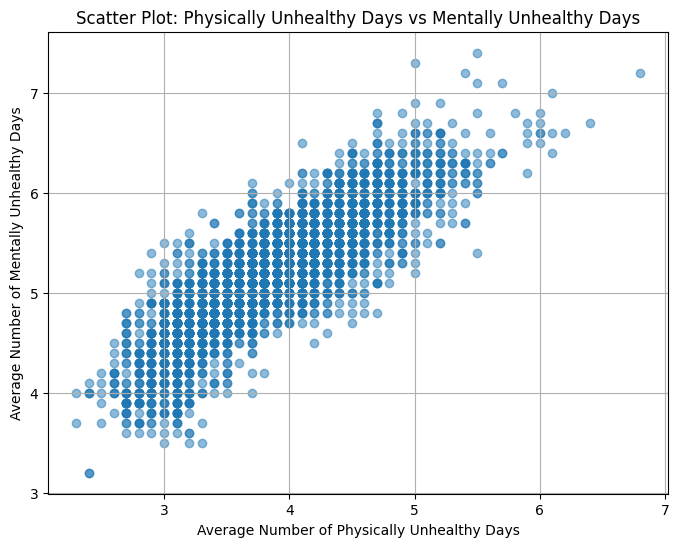

In [ ]:
### OVERALL BASIC VISUALIZATION

# Plot 1: Scatter plot comparing Physically Unhealthy Days vs Mentally Unhealthy Days
plt.figure(figsize=(8, 6))
plt.scatter(merged_df["Average Number of Physically Unhealthy Days"], merged_df["Average Number of Mentally Unhealthy Days"], alpha=0.5)
plt.xlabel("Average Number of Physically Unhealthy Days")
plt.ylabel("Average Number of Mentally Unhealthy Days")
plt.title("Scatter Plot: Physically Unhealthy Days vs Mentally Unhealthy Days")
plt.grid(True)
plt.show()

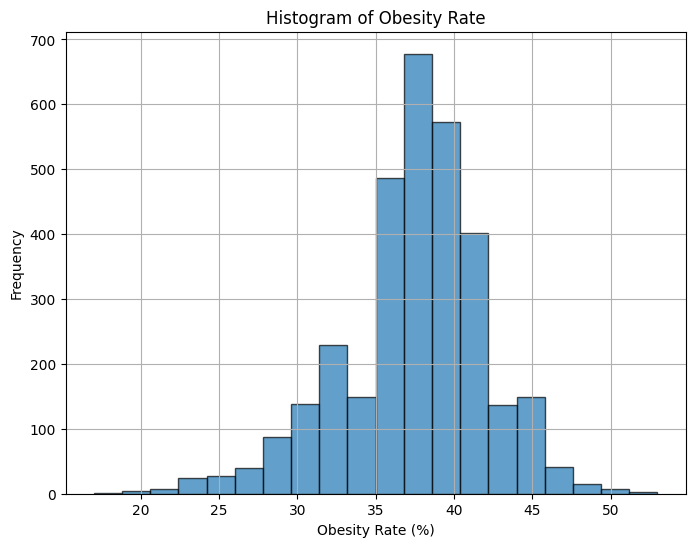

In [ ]:

# Plot 2: Histogram for Obesity Rate
plt.figure(figsize=(8, 6))
plt.hist(merged_df["% Adults with Obesity"].dropna(), bins=20, edgecolor='black', alpha=0.7)
plt.xlabel("Obesity Rate (%)")
plt.ylabel("Frequency")
plt.title("Histogram of Obesity Rate")
plt.grid(True)
plt.show()



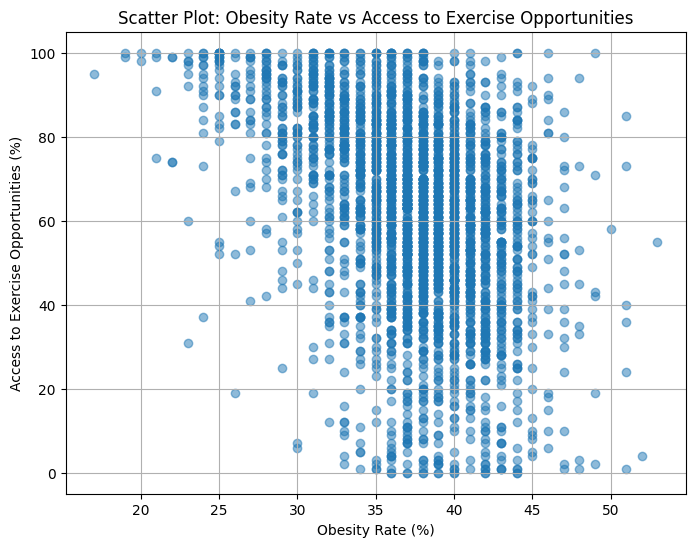

In [ ]:


# Plot 3: Scatter plot of Obesity Rate vs Access to Exercise Opportunities
plt.figure(figsize=(8, 6))
plt.scatter(merged_df["% Adults with Obesity"], merged_df["% With Access to Exercise Opportunities"], alpha=0.5)
plt.xlabel("Obesity Rate (%)")
plt.ylabel("Access to Exercise Opportunities (%)")
plt.title("Scatter Plot: Obesity Rate vs Access to Exercise Opportunities")
plt.grid(True)
plt.show()




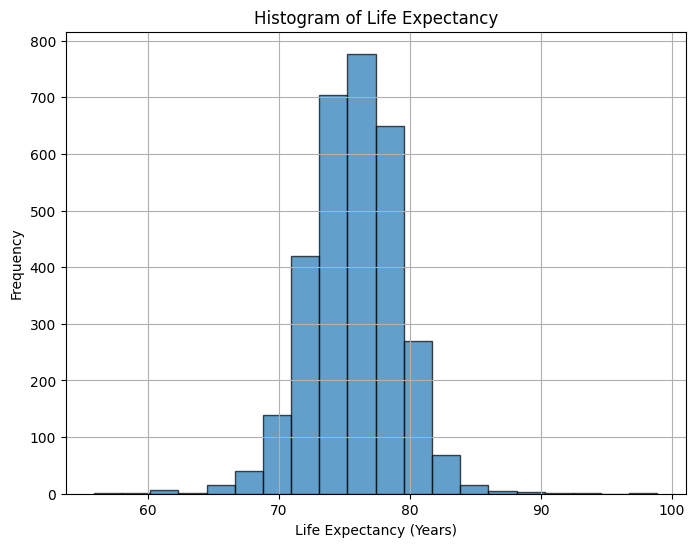

In [ ]:

# Plot 4: Histogram of Life Expectancy
plt.figure(figsize=(8, 6))
plt.hist(merged_df["Life Expectancy"].dropna(), bins=20, edgecolor='black', alpha=0.7)
plt.xlabel("Life Expectancy (Years)")
plt.ylabel("Frequency")
plt.title("Histogram of Life Expectancy")
plt.grid(True)
plt.show()




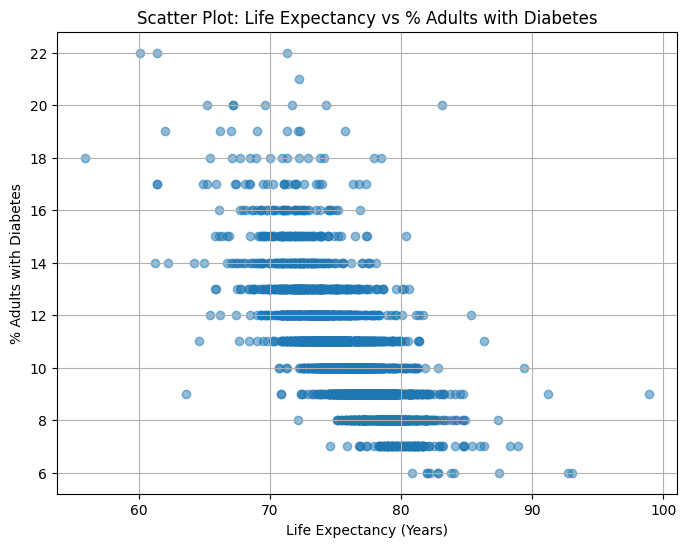

In [ ]:

# Plot 5: Scatter plot of Life Expectancy vs % Adults with Diabetes
plt.figure(figsize=(8, 6))
plt.scatter(merged_df["Life Expectancy"], merged_df["% Adults with Diabetes"], alpha=0.5)
plt.xlabel("Life Expectancy (Years)")
plt.ylabel("% Adults with Diabetes")
plt.title("Scatter Plot: Life Expectancy vs % Adults with Diabetes")
plt.grid(True)
plt.show()


In [ ]:
#MERGE DATA AND CREATE CATEGORIES FOR FURTHER ANALYSIS

# Define categories and their corresponding keywords
categories = {
    "Health": ["health", "life expectancy", "mortality", "disease", "obesity",
               "smoking", "diabetes", "physically unhealthy", "mentally unhealthy",
               "limited access to healthy foods", "overdose", "hospitalization"],

    "Economic": ["income", "unemployment", "poverty", "education", "employment", "housing", "insurance"],

    "Social_Demographic": ["population", "age", "race", "ethnicity", "education", "language", "family"],

    "Environmental": ["air pollution", "food access", "water quality", "housing problems", "severe housing cost"],

    "Intoxication": ["smoking", "alcohol", "binge drinking", "drug", "overdose", "opioid"]
}

# Extract category-wise data
category_data = {}
for category, keywords in categories.items():
    category_columns = [col for col in merged_df.columns if any(keyword in col.lower() for keyword in keywords)]
    category_data[category] = merged_df[["FIPS", "State", "County"] + category_columns]

# Compute summary statistics and correlation matrices for each category
summary_stats = {category: df.describe() for category, df in category_data.items()}
correlation_matrices = {category: df.select_dtypes(include=["number"]).corr() for category, df in category_data.items()}




## Merged Data into Categories

In [ ]:
# Display summary statistics and correlation matrices
#import ace_tools as tools
#for category in categories.keys():
#    tools.display_dataframe_to_user(name=f"{category} Data Summary", dataframe=summary_stats[category])
 #   tools.display_dataframe_to_user(name=f"{category} Correlation Matrix", dataframe=correlation_matrices[category])

# Function to plot correlation heatmaps
def plot_correlation_heatmap(correlation_matrix, title):
    plt.figure(figsize=(12, 8))
    sns.heatmap(correlation_matrix, cmap="coolwarm", center=0, annot=True, fmt=".2f")
    plt.title(title)
    plt.show()

# Function to plot histograms
def plot_histogram(data, column, title, xlabel):
    plt.figure(figsize=(10, 6))
    sns.histplot(data[column], bins=30, kde=True, color="purple")
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel("Frequency")
    plt.show()

# Function to plot scatter plots
def plot_scatter(data, x_col, y_col, title, xlabel, ylabel):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=data, x=x_col, y=y_col, alpha=0.6)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Function to plot box plots
def plot_boxplot(data, x_col, y_col, title, ylabel):
    plt.figure(figsize=(15, 6))
    sns.boxplot(data=data, x=x_col, y=y_col)
    plt.xticks(rotation=90)
    plt.title(title)
    plt.ylabel(ylabel)
    plt.show()


## Health Factors

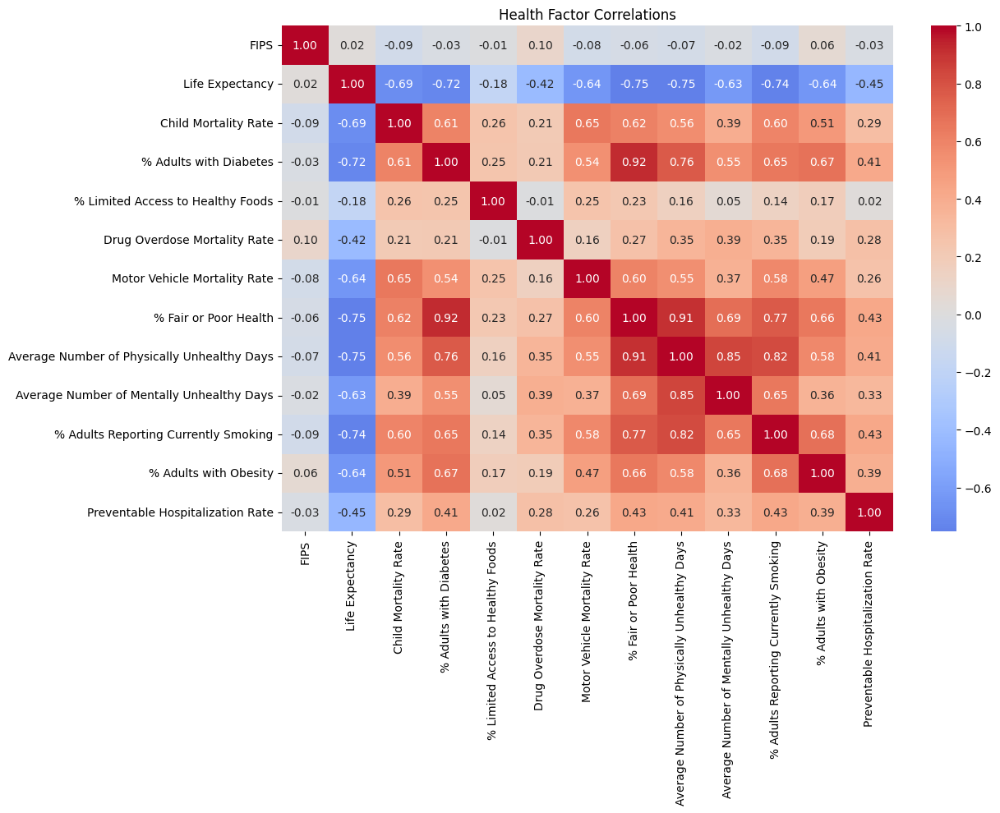

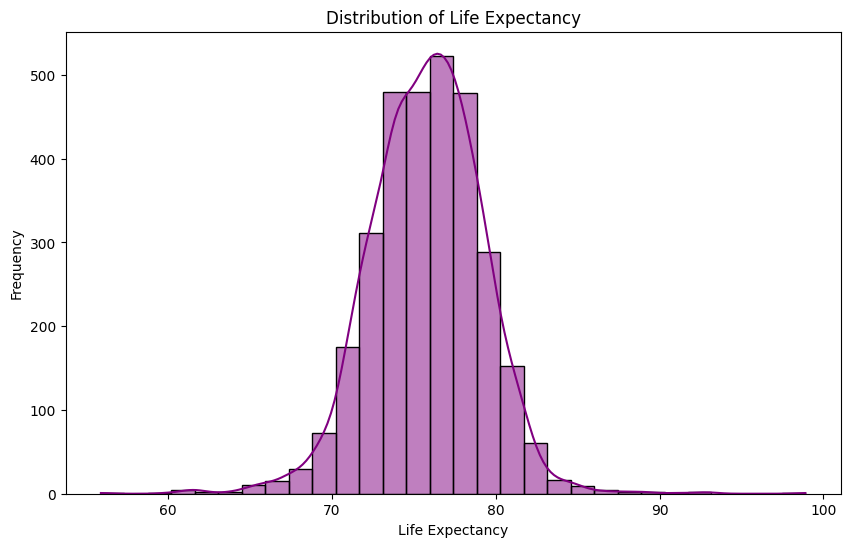

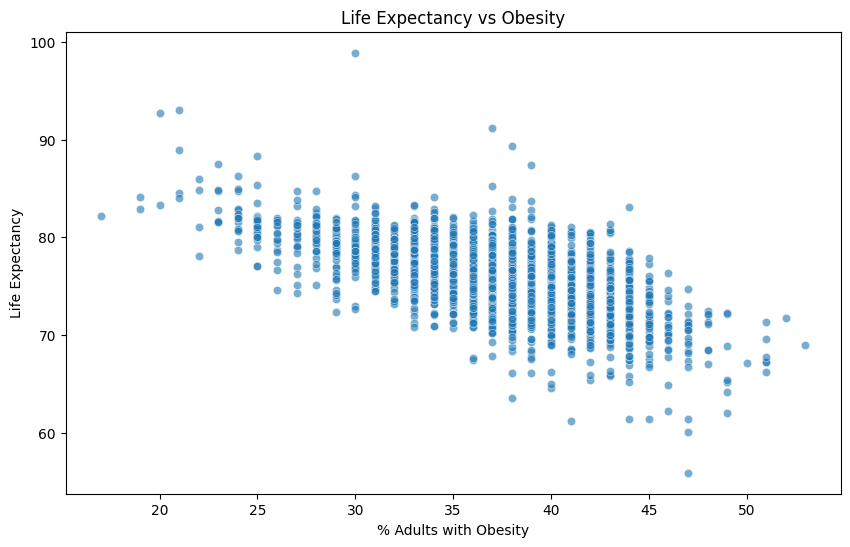

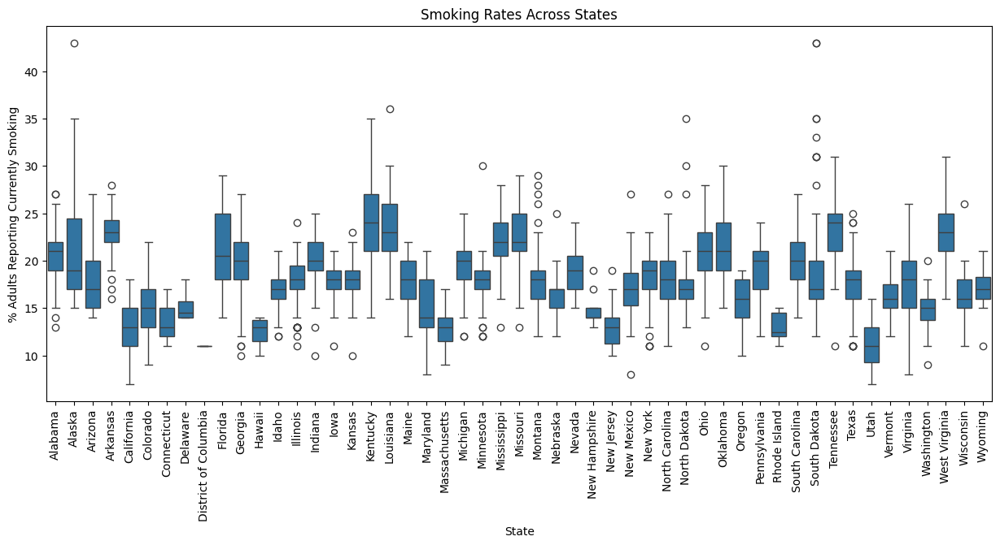

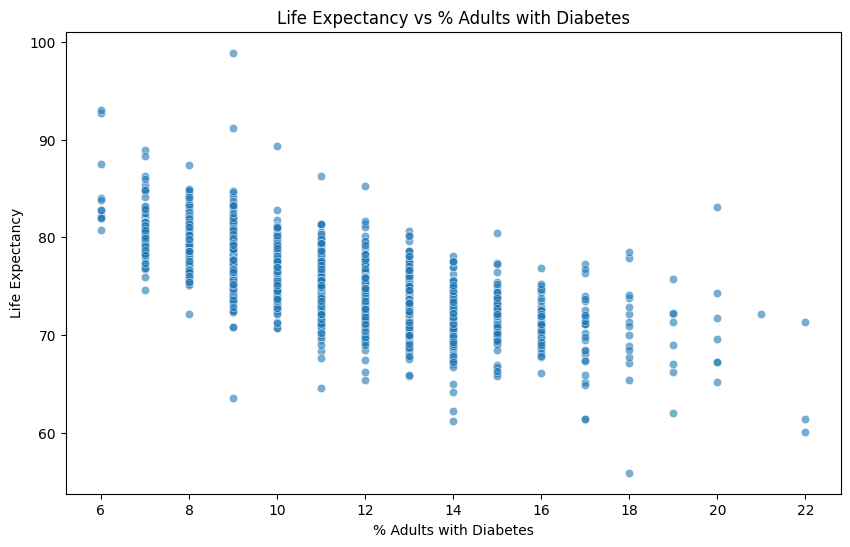

In [ ]:
# Generate visualizations for each category

# Health Factors
plot_correlation_heatmap(correlation_matrices["Health"], "Health Factor Correlations")
plot_histogram(category_data["Health"], "Life Expectancy", "Distribution of Life Expectancy", "Life Expectancy")
plot_scatter(category_data["Health"], "% Adults with Obesity", "Life Expectancy", "Life Expectancy vs Obesity", "% Adults with Obesity", "Life Expectancy")
plot_boxplot(category_data["Health"], "State", "% Adults Reporting Currently Smoking", "Smoking Rates Across States", "% Adults Reporting Currently Smoking")
# Scatter plot of Life Expectancy vs % Adults with Diabetes
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_df, x="% Adults with Diabetes", y="Life Expectancy", alpha=0.6)
plt.title("Life Expectancy vs % Adults with Diabetes")
plt.xlabel("% Adults with Diabetes")
plt.ylabel("Life Expectancy")
plt.show()



1. **Heatmap of Health Factor Correlations** → Life expectancy has a strong negative correlation with obesity (-0.64), diabetes (-0.72), and fair/poor health (-0.76), indicating these factors significantly impact longevity. Positive correlations exist among obesity, diabetes, unhealthy days, and hospitalization rates, suggesting interlinked health risks.

2. **Distribution of Life Expectancy (Histogram with KDE)** → The histogram follows a normal distribution, with most life expectancy values clustering between 75-80 years. Very few regions have extreme values (below 60 or above 90), confirming a central tendency around 77 years.

3. **Life Expectancy vs. % Adults with Obesity (Scatter Plot)** → A strong negative correlation exists, where higher obesity rates (>40%) are associated with lower life expectancy (<75 years). Regions with lower obesity rates (~20%) tend to have a life expectancy above 80 years.

4. **Smoking Rates Across States (Box Plot)** → Smoking rates vary widely across states, with some (e.g., Kentucky, West Virginia) showing high median rates, while others (e.g., California, Utah) have lower rates. Outliers indicate states with extreme smoking behaviors.

5. **Life Expectancy vs. % Adults with Diabetes (Scatter Plot)** → A clear negative correlation shows that as diabetes prevalence increases, life expectancy decreases. Regions with diabetes rates above 15% typically have a life expectancy below 75 years, emphasizing diabetes as a major health concern.

## Economic Factors

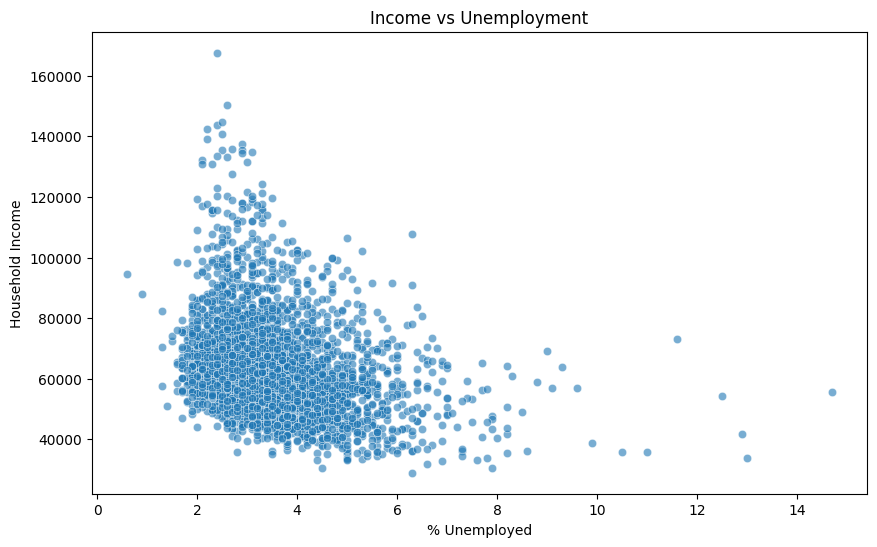

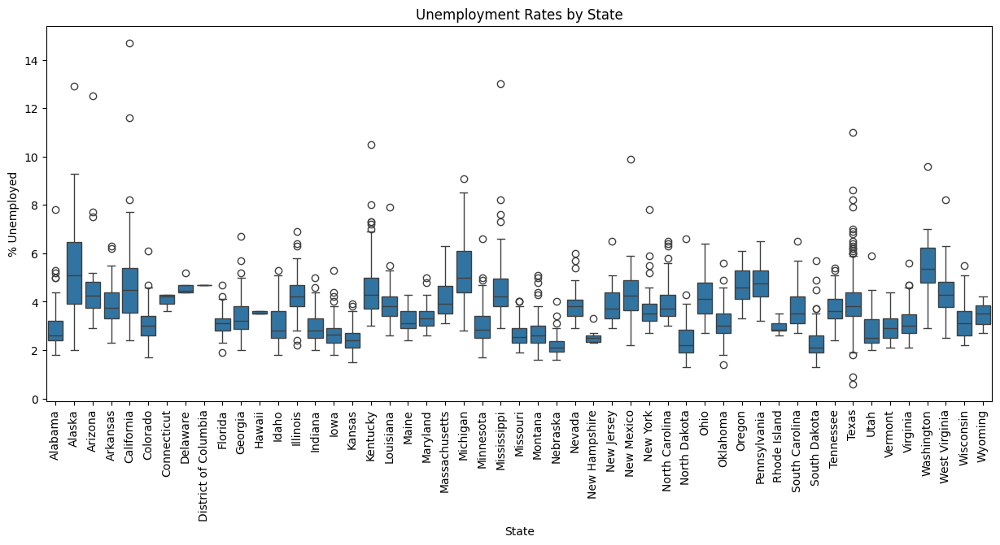

In [ ]:
# Economic factors
# Extract economic-related data
economic_data = merged_df[["State", "Median Household Income", "% Unemployed"]].dropna()
# Reattempt the scatter plot for "% Unemployed" vs "Median Household Income"
plot_scatter(economic_data, "% Unemployed", "Median Household Income",
             "Income vs Unemployment", "% Unemployed", "Household Income")
# Reattempt the boxplot of "% Unemployed" by State
plot_boxplot(economic_data, "State", "% Unemployed", "Unemployment Rates by State", "% Unemployed")


**1. Income vs. Unemployment** (Scatter Plot):
Higher unemployment rates generally correspond to lower household incomes, showing a negative correlation. Most data points are clustered around 2-6% unemployment with incomes between $40,000 and $80,000.

**2.  Unemployment Rates by State** (Box Plot):
This box plot shows unemployment rate distributions across states, highlighting variations and outliers. Some states have a wider spread, indicating fluctuations in unemployment levels.

## Socio-Demographic Factors

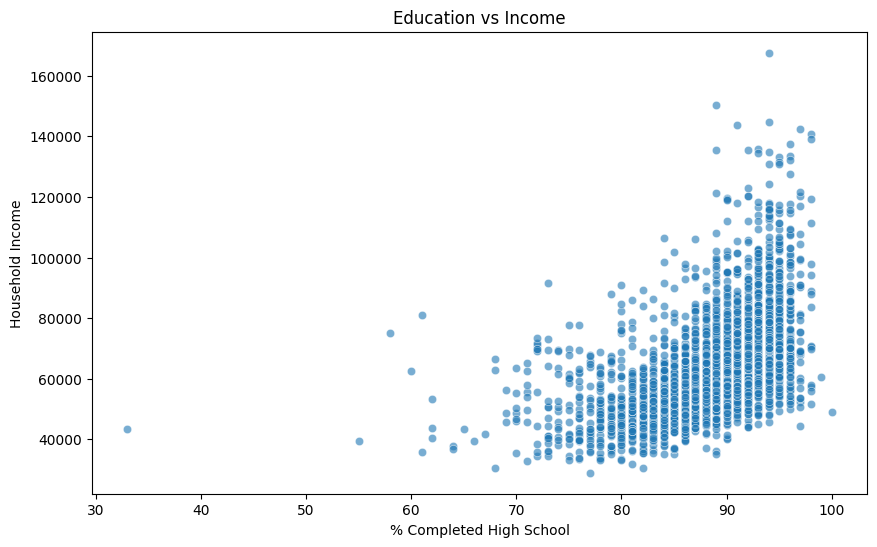

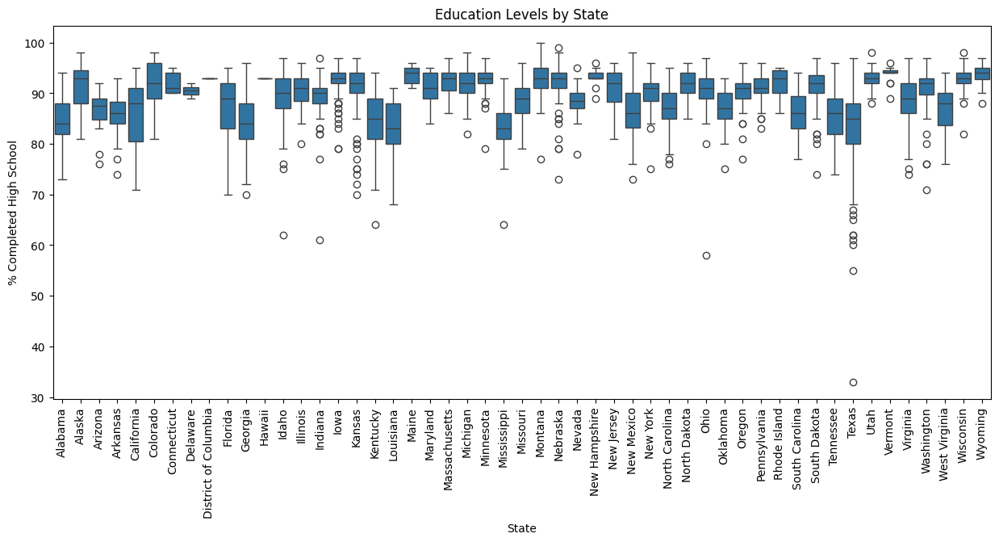

In [ ]:
# Social & Demographic Factors
# Extract Social & Demographic related data
social_demo_data = merged_df[["State", "Population", "% Completed High School", "Median Household Income"]].dropna()
# Plot Scatter: Education vs Income (Using '% Completed High School' instead of non-existent column)
plot_scatter(social_demo_data, "% Completed High School", "Median Household Income",
             "Education vs Income", "% Completed High School", "Household Income")
# Plot Boxplot: Education Levels by State
plot_boxplot(social_demo_data, "State", "% Completed High School", "Education Levels by State", "% Completed High School")

**1. Education vs. Income** (Scatter Plot):
Higher high school completion rates are associated with higher household incomes, showing a positive correlation. Most data points are clustered around 80-100% completion, with incomes rising significantly at higher education levels.


**2.  Education Levels by State** (Box Plot):
This box plot shows the distribution of high school completion rates across states, with most states having a high median completion rate. Some states have greater variability, indicated by wider spreads and more outliers.


## Environmental Factors

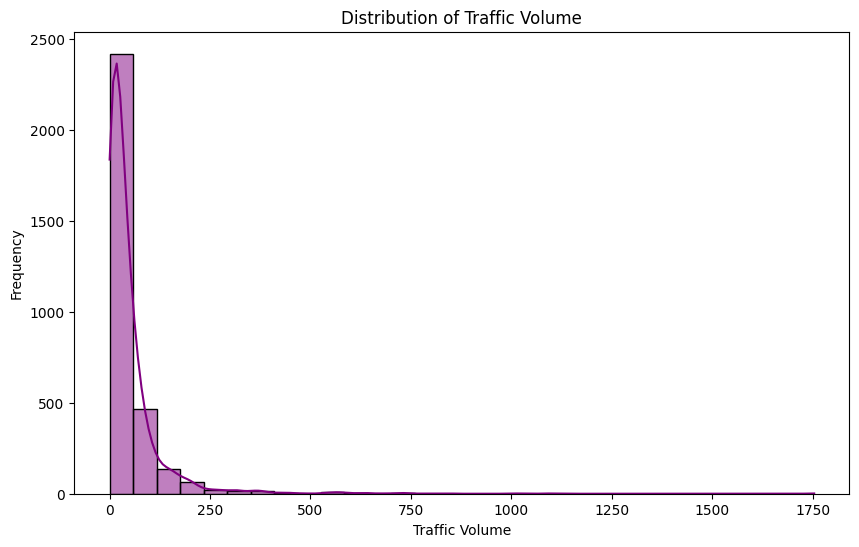

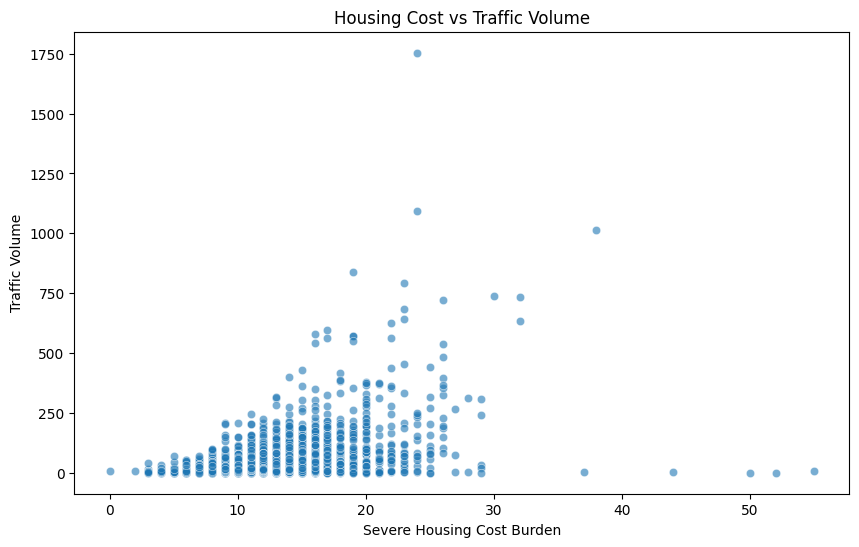

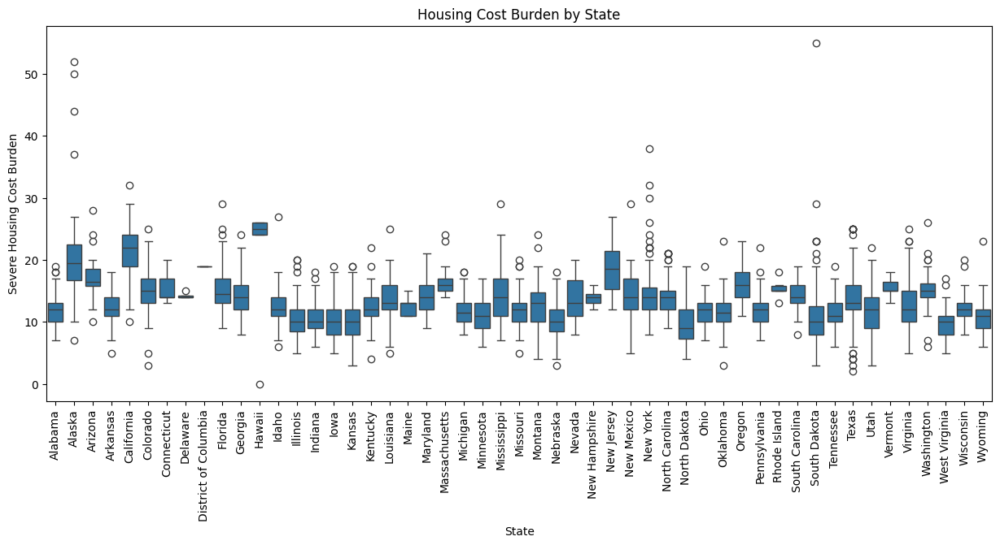

In [ ]:
# Environmental Factors
# Extract Environmental-related data
environmental_data = merged_df[["State", "Traffic Volume", "% Severe Housing Problems"]].dropna()
# Plot Histogram: Distribution of Traffic Volume (as a proxy for air pollution)
plot_histogram(environmental_data, "Traffic Volume", "Distribution of Traffic Volume", "Traffic Volume")
# Plot Scatter: Severe Housing Cost Burden vs Traffic Volume
plot_scatter(environmental_data, "% Severe Housing Problems", "Traffic Volume",
             "Housing Cost vs Traffic Volume", "Severe Housing Cost Burden", "Traffic Volume")
# Plot Boxplot: Severe Housing Cost Burden by State
plot_boxplot(environmental_data, "State", "% Severe Housing Problems", "Housing Cost Burden by State", "Severe Housing Cost Burden")


## Intoxication Factors


**1.  Distribution of Traffic Volume**(Histogram + KDE):
The distribution is highly skewed, with most traffic volumes concentrated at lower values. A few outliers exist with significantly higher traffic volumes.

**2. Housing Cost vs. Traffic Volume** (Scatter Plot):
There is a positive correlation between severe housing cost burden and traffic volume, with higher housing costs generally associated with higher traffic. However, some outliers show high traffic even at lower housing burdens.

**3. Housing Cost Burden by State** (Box Plot):
This box plot shows variations in severe housing cost burdens across states, with some states having higher median burdens and more outliers. The spread of values varies, indicating differing housing affordability challenges.

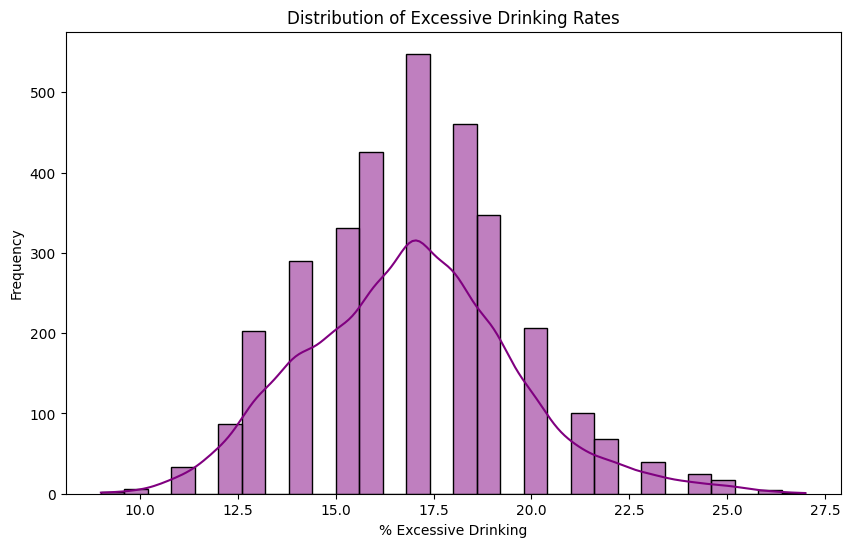

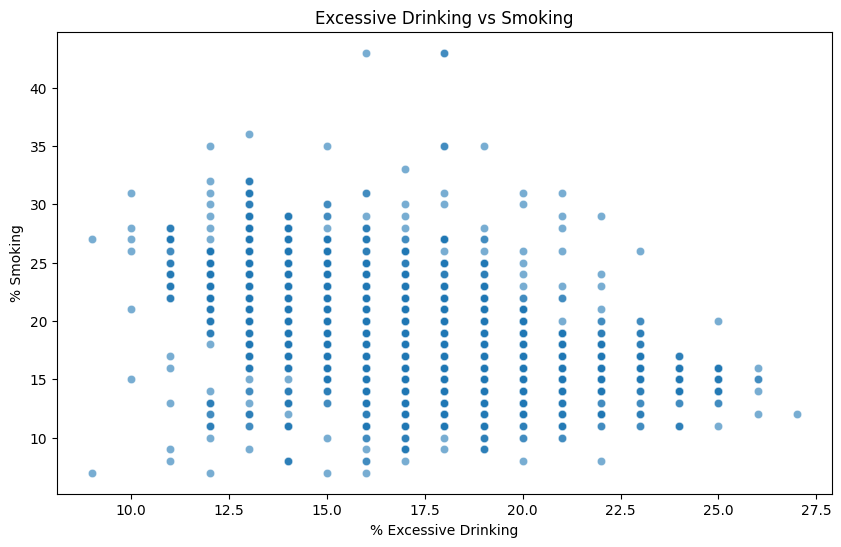

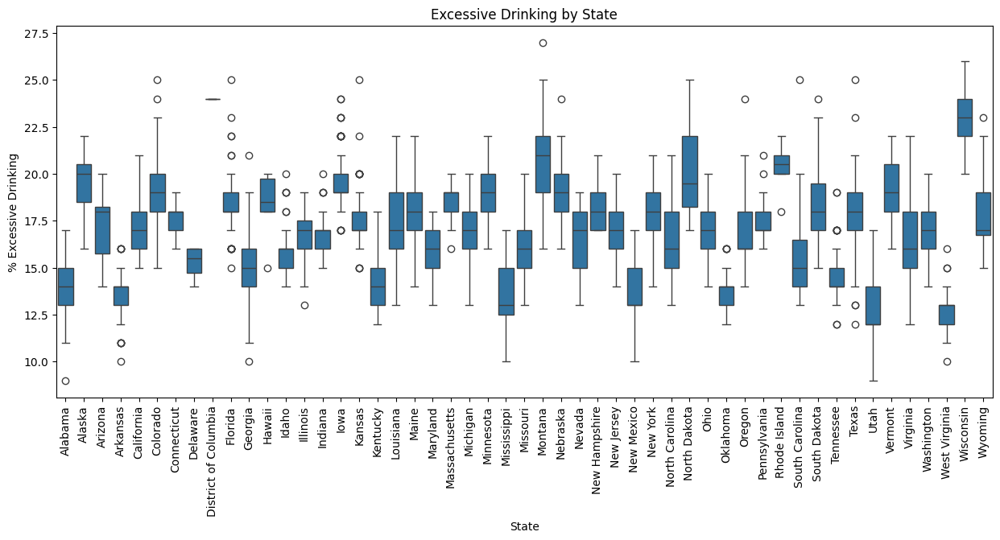

In [ ]:
# Intoxication Factors
# Extract Intoxication-related data
intoxication_data = merged_df[["State", "% Excessive Drinking", "% Adults Reporting Currently Smoking"]].dropna()
# Plot Histogram: Distribution of Excessive Drinking Rates
plot_histogram(intoxication_data, "% Excessive Drinking", "Distribution of Excessive Drinking Rates", "% Excessive Drinking")
# Plot Scatter: Excessive Drinking vs Smoking
plot_scatter(intoxication_data, "% Excessive Drinking", "% Adults Reporting Currently Smoking",
             "Excessive Drinking vs Smoking", "% Excessive Drinking", "% Smoking")
# Plot Boxplot: Excessive Drinking by State
plot_boxplot(intoxication_data, "State", "% Excessive Drinking", "Excessive Drinking by State", "% Excessive Drinking")


**1. Distribution of Excessive Drinking Rates**(Histogram + KDE):
The distribution is approximately normal, centered around 17-18% excessive drinking rates. Most values fall between 10% and 25%, with a slight right skew.

**2. Excessive Drinking vs. Smoking** (Scatter Plot):
There is a weak positive correlation between excessive drinking and smoking rates. Higher excessive drinking rates are associated with slightly higher smoking rates, though variability exists.

**3. Excessive Drinking by State** (Box Plot):
Excessive drinking rates vary by state, with some states having consistently higher median rates. There are noticeable outliers in certain states, indicating pockets of excessive drinking prevalence.









## Shapefiles merged, plotted using Folium

The shapefile of every county and state is merged using outer join to the Exisitng Merged dataframe which includes the socio-economic features. This will also help in better visulaization ahead in the notebook to interpret the variables and the status of states given the metrics.

In [ ]:
# Ensure both keys are strings before merging
if us_county is not None and merged_df is not None:
    us_county['GEOID'] = us_county['GEOID'].astype(str)
    merged_df['FIPS'] = merged_df['FIPS'].astype(str)

    # Merge with County Shapefiles
    county_merged_gdf = us_county.merge(
        merged_df, how='outer', left_on='GEOID', right_on='FIPS', indicator='merge_indicator'
    )

# Ensure STATEFP and FIPS are strings before merging
if us_state is not None and merged_df is not None:
    us_state["STATEFP"] = us_state["STATEFP"].astype(str)
    merged_df["FIPS"] = merged_df["FIPS"].astype(str)

    # Merge with State Shapefiles
    state_merged_gdf = us_state.merge(
        merged_df, how='outer', left_on='STATEFP', right_on='FIPS', indicator='state_merge_indicator'
    )


this map plots all the counties and states of the United States using folium. This will act like a base map for the visulaization below. The merge above is outer and attaches both county geo-coordinates and state geo-coordinates for every county.

In [ ]:
# NOTE: THIS CODE MIGHT TAKE A WHILE TO RUN!
# Create Folium Map
m = folium.Map(location=[37.8, -96], zoom_start=4)

# Add County Layer if available
if us_county is not None and 'county_merged_gdf' in locals():
    folium.GeoJson(
        county_merged_gdf,
        name='Counties',
        style_function=lambda x: {'fillColor': 'blue', 'color': 'black', 'weight': 0.5, 'fillOpacity': 0.4}
    ).add_to(m)

# Add State Layer if available
if us_state is not None and 'state_merged_gdf' in locals():
    folium.GeoJson(
        state_merged_gdf,
        name='States',
        style_function=lambda x: {'fillColor': 'none', 'color': 'red', 'weight': 1.5}
    ).add_to(m)

# Add Layer Control
folium.LayerControl().add_to(m)

# Save and Display Map
map_path = "us_map.html"
m.save(map_path)

print(f"Map saved at: {map_path}")


Map saved at: us_map.html


The screenshot of the above map is attached below:

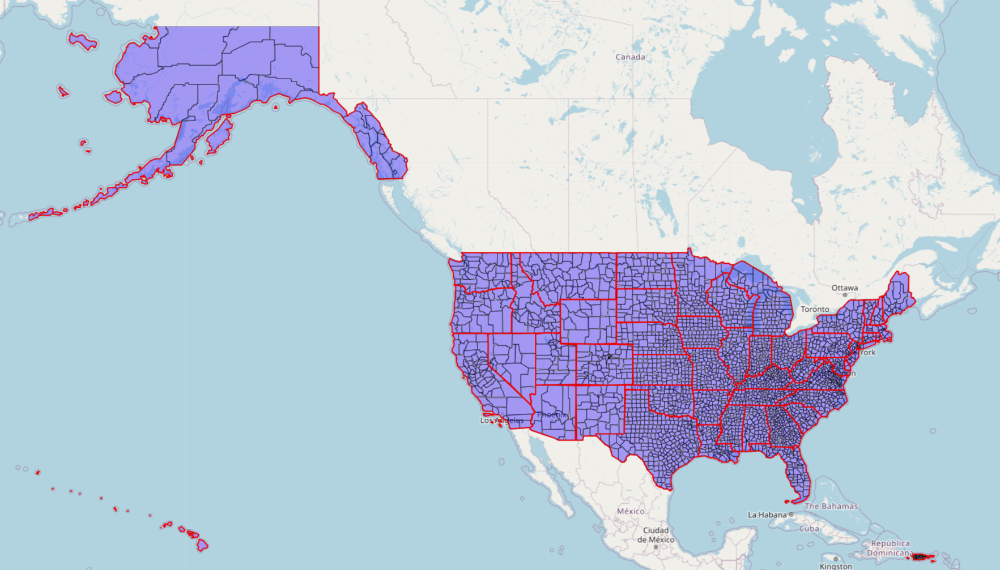

## Demographic Visualization

To understand the demographic distribution of the Country as well as the diversity within indiividual states, the previous base map is now color-coded depending on which race is majorly living in that area.

White to represent native White Americans
Black to represent Black Americans
Yellow to represent Hispanic-Origin Americans

The map showcases that most of the country is White Americans along with proportionally smaller population of Hispanic and Blacks

In [ ]:
# NOTE: THIS CODE MIGHT TAKE A WHILE TO RUN!
# Racial Demographics Processing
race_columns = ['% Black', '% Hispanic', '% Non-Hispanic White']

for col in race_columns:
    county_merged_gdf[col] = pd.to_numeric(county_merged_gdf[col], errors='coerce')

# Function to determine racial majority
def get_majority_color(row):
    if row['% Black'] > row['% Hispanic'] and row['% Black'] > row['% Non-Hispanic White']:
        return 'black'
    elif row['% Hispanic'] > row['% Black'] and row['% Hispanic'] > row['% Non-Hispanic White']:
        return 'yellow'
    else:
        return 'white'

county_merged_gdf['color'] = county_merged_gdf.apply(get_majority_color, axis=1)

# Folium Map Creation
m = folium.Map(location=[37.8, -96], zoom_start=4)

# Identify correct county column name (Assuming "NAME" or "County" exists)
available_columns = county_merged_gdf.columns
county_name_column = "NAME" if "NAME" in available_columns else "County"

# Add County Layer with Majority Race Coloring
folium.GeoJson(
    county_merged_gdf,
    name='Racial Majority',
    style_function=lambda x: {'fillColor': x['properties']['color'], 'color': 'gray', 'weight': 0.5, 'fillOpacity': 0.7},
    tooltip=folium.GeoJsonTooltip(
        fields=[county_name_column, '% Black', '% Hispanic', '% Non-Hispanic White'],  # FIXED: Using correct county column
        aliases=['County:', 'Black %:', 'Hispanic %:', 'White %:'],
        localize=True
    )
).add_to(m)

# Add State Layer if available
if us_state is not None:
    folium.GeoJson(
        state_merged_gdf,
        name='States',
        style_function=lambda x: {'fillColor': 'none', 'color': 'red', 'weight': 1.5}
    ).add_to(m)

# Add Layer Control
folium.LayerControl().add_to(m)

# Save and Display Map
map_path = "/content/Demographics.html"
m.save(map_path)

print(f"Map saved at: {map_path}")


Map saved at: /content/Demographics.html


The screenshot of the above map is attached below:

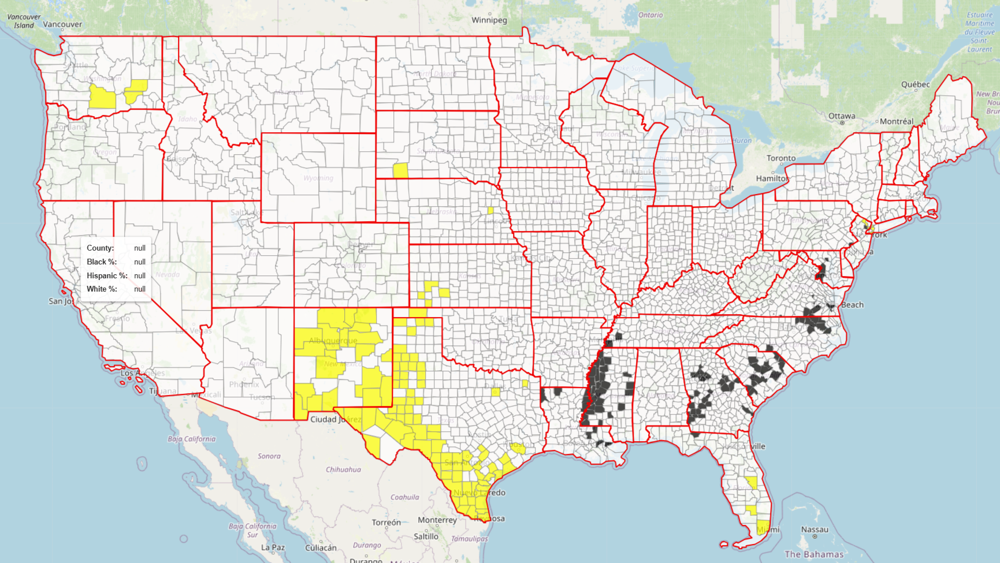

**Black** (Black Shaded Counties): These are counties where a significant portion of the population is Black. They are mainly concentrated in the southeastern U.S., particularly in states like Mississippi, Alabama, Georgia, and South Carolina.

**Hispanic** (Yellow Shaded Counties): These are counties where the Hispanic population is dominant or significant. The concentration is primarily in the southwestern U.S., especially in Texas, New Mexico, Arizona, and southern California. There are also some pockets of Hispanic-majority counties in southern Florida.

**White** (Unshaded or Light Gray Counties): These are counties where the White population is the majority. These counties are widespread across the U.S., particularly in the Midwest, Northern, and Western regions.

## Aggregating results based on States and Variables

As there are too many counties for every state, the below drop-down menu gives the Average of the state for all features. This helps in understanding every state individually

In [ ]:
import ipywidgets as widgets
from IPython.display import display

# Extract numerical columns
numerical_columns = select_measure_data.select_dtypes(include=["number"]).columns.tolist()

# Dropdown for selecting a state
state_dropdown = widgets.Dropdown(
    options=select_measure_data["State"].dropna().unique(),  # Ensure your dataset has a 'State' column
    description="Select State:"
)

# Output display
output = widgets.Output()

# Function to display averages
def display_averages(state):
    with output:
        output.clear_output()

        # Filter data for selected state
        state_data = select_measure_data[select_measure_data["State"] == state]

        # Compute averages for numerical columns
        averages = state_data[numerical_columns].mean()

        # Display the result
        print(f"Averages for {state}:\n")
        display(averages)

# Link dropdown selection to the function
widgets.interactive(display_averages, state=state_dropdown)

# Display the UI
display(state_dropdown, output)


Averages for Illinois:



,0
FIPS,17101.009709
Life Expectancy,76.571845
Age-Adjusted Death Rate,425.757282
Child Mortality Rate,57.868852
% Frequent Physical Distress,11.398058
% Frequent Mental Distress,16.427184
% Adults with Diabetes,9.582524
HIV Prevalence Rate,112.134146
% Food Insecure,9.873786
% Limited Access to Healthy Foods,7.281553


Simialr to the drop down menu above, this is a drop down menu centred around the features. Here we get to choose the variables and the corresponding top 5 and bottom 5 states are presented.

This can be an interactive way to group the states using groupby feature based on a particular menu

In [ ]:
# Ensure numerical columns are correctly identified
numerical_columns = select_measure_data.select_dtypes(include=["number"]).columns.tolist()

# Dropdown for selecting a variable
variable_dropdown = widgets.Dropdown(
    options=numerical_columns,
    description="Select Variable:"
)

# Output display
output_top_bottom = widgets.Output()

# Function to compute and display top and bottom 5 states
def display_top_bottom(variable):
    with output_top_bottom:
        output_top_bottom.clear_output()

        # Compute state-wise averages
        state_averages = select_measure_data.groupby("State")[variable].mean().dropna()

        # Get top 5 and bottom 5 states
        top_5 = state_averages.nlargest(5)
        bottom_5 = state_averages.nsmallest(5)

        # Display results
        print(f"Top 5 States for {variable}:")
        display(top_5)
        print("\nBottom 5 States for {variable}:")
        display(bottom_5)

# Link dropdown selection to function
widgets.interactive(display_top_bottom, variable=variable_dropdown)

# Display the UI
display(variable_dropdown, output_top_bottom)


Dropdown(description='Select Variable:', options=('FIPS', 'Life Expectancy', 'Age-Adjusted Death Rate', 'Child…

Output()

## State- Variable Analysis

The below code gives an interactive slicer where by choosing a State and feature, a folium map of that state is displayed where the counties of that given states are coloured using a gradient to depict the intensity of the feature selected.

In [ ]:
# Ensure correct state names for dropdown
county_merged_gdf['State'] = county_merged_gdf['State'].astype(str)
state_list = sorted(county_merged_gdf['State'].dropna().unique())
variable_list = [col for col in merged_df.columns if col not in ['FIPS', 'State', 'County']]

# ---- Function to generate map based on user selection ---- #
def generate_map(selected_state, selected_variable):
    filtered_gdf = county_merged_gdf[county_merged_gdf['State'] == selected_state].copy()

    if filtered_gdf.empty:
        print("No data available for the selected state.")
        return

    filtered_gdf = filtered_gdf.to_crs(epsg=4326)  # Keep CRS in WGS84 for folium compatibility

    m = folium.Map(
        location=[filtered_gdf.geometry.centroid.y.mean(), filtered_gdf.geometry.centroid.x.mean()],
        zoom_start=6
    )

    # Create color scale
    min_val = filtered_gdf[selected_variable].min()
    max_val = filtered_gdf[selected_variable].max()
    colormap = cm.LinearColormap(colors=['yellow', 'orange', 'red'], vmin=min_val, vmax=max_val)
    colormap.caption = f"{selected_variable} Intensity"

    folium.GeoJson(
        filtered_gdf,
        name=f"{selected_state} - {selected_variable}",
        style_function=lambda x: {
            'fillColor': colormap(x['properties'][selected_variable]) if x['properties'].get(selected_variable) else 'gray',
            'color': 'black', 'weight': 0.5, 'fillOpacity': 0.7
        },
        tooltip=folium.GeoJsonTooltip(
            fields=['County', selected_variable],  # FIXED: Ensured 'County' exists
            aliases=['County:', f'{selected_variable}:'],
            localize=True
        )
    ).add_to(m)

    colormap.add_to(m)
    folium.LayerControl().add_to(m)
    display(m)

# ---- Create interactive dropdowns ---- #
state_dropdown = Dropdown(options=state_list, description="State")
variable_dropdown = Dropdown(options=variable_list, description="Variable")

ui = VBox([state_dropdown, variable_dropdown])
output = interactive_output(generate_map, {'selected_state': state_dropdown, 'selected_variable': variable_dropdown})

display(ui, output)


Output()

## Mapping Variables:

Recoding few variables will help in understanding the data with ease. For this purpose, the following features are encoded/ binned as the following:

1. Medain income level: Low, Medium, High
2 .Education: Low, moderate, high
3. Population density:

In [ ]:
def categorize_income(x):
    if x < 40000:
        return "Low Income"
    elif x < 80000:
        return "Middle Income"
    else:
        return "High Income"

In [ ]:
def recode_education(x):
    if x < 30:
        return "Low Education"
    elif x < 60:
        return "Moderate Education"
    else:
        return "Highly Educated"

In [ ]:
# Define function to classify counties as Rural, Suburban, or Urban based on % Rural
def classify_area(x):
    if x > 80:
        return "Rural"
    elif x > 40:
        return "Suburban"
    else:
        return "Urban"

In [ ]:

# Apply categorization
merged_df["Income_Category"] = merged_df["Median Household Income"].map(categorize_income)
merged_df["Education_Level"] = merged_df["% Some College"].map(recode_education)
merged_df["Area_Type"] = merged_df["% Rural"].map(classify_area)


In [ ]:
# Print first 10 rows
print(merged_df[["State", "County", "Income_Category", "Education_Level", "Area_Type"]].head(10))


     State    County Income_Category     Education_Level Area_Type
0  Alabama       NaN   Middle Income     Highly Educated  Suburban
1  Alabama   Autauga   Middle Income     Highly Educated  Suburban
2  Alabama   Baldwin   Middle Income     Highly Educated     Urban
3  Alabama   Barbour   Middle Income  Moderate Education  Suburban
4  Alabama      Bibb   Middle Income  Moderate Education     Rural
5  Alabama    Blount   Middle Income  Moderate Education     Rural
6  Alabama   Bullock      Low Income  Moderate Education     Rural
7  Alabama    Butler   Middle Income  Moderate Education  Suburban
8  Alabama   Calhoun   Middle Income  Moderate Education     Urban
9  Alabama  Chambers   Middle Income  Moderate Education  Suburban


## Slicing datasets

In [ ]:
# Define the updated column list with correct names
selected_columns_extended = [
    "State", "County", "Median Household Income", "% Adults with Diabetes",
    "% Adults with Obesity", "Life Expectancy", "Preventable Hospitalization Rate",
    "% Excessive Drinking", "% Unemployed", "Income Ratio",
    "% Adults Reporting Currently Smoking"  # Fixed smoking column name
]



In [ ]:
# Filter rural and urban data with the corrected selected columns
rural_counties_data = merged_df[merged_df["Area_Type"] == "Rural"][selected_columns_extended]
urban_counties_data = merged_df[merged_df["Area_Type"] == "Urban"][selected_columns_extended]

# Display first few rows of both datasets
from IPython.display import display

print("Updated Rural Counties Data:")
display(rural_counties_data.head(10))

print("\nUpdated Urban Counties Data:")
display(urban_counties_data.head(10))


Updated Rural Counties Data:


,State,County,Median Household Income,% Adults with Diabetes,% Adults with Obesity,Life Expectancy,Preventable Hospitalization Rate,% Excessive Drinking,% Unemployed,Income Ratio,% Adults Reporting Currently Smoking
4,Alabama,Bibb,54309.0,12.0,40.0,72.3,4651.0,15.0,2.5,5.7,22.0
5,Alabama,Blount,60553.0,11.0,38.0,73.4,2499.0,15.0,2.2,4.6,20.0
6,Alabama,Bullock,35798.0,19.0,49.0,72.1,2268.0,12.0,2.8,7.1,26.0
10,Alabama,Cherokee,52613.0,11.0,38.0,72.7,4153.0,14.0,2.3,4.5,22.0
11,Alabama,Chilton,61823.0,12.0,42.0,73.5,3581.0,15.0,2.3,4.1,22.0
12,Alabama,Choctaw,44458.0,14.0,45.0,73.8,2712.0,12.0,3.8,6.2,22.0
13,Alabama,Clarke,44906.0,14.0,43.0,71.0,3623.0,12.0,5.0,5.7,22.0
14,Alabama,Clay,49599.0,12.0,42.0,71.8,2559.0,14.0,2.3,5.5,21.0
15,Alabama,Cleburne,49248.0,11.0,36.0,72.0,2478.0,15.0,2.4,4.4,21.0
18,Alabama,Conecuh,36106.0,15.0,45.0,69.5,7136.0,12.0,3.5,5.0,23.0



Updated Urban Counties Data:


,State,County,Median Household Income,% Adults with Diabetes,% Adults with Obesity,Life Expectancy,Preventable Hospitalization Rate,% Excessive Drinking,% Unemployed,Income Ratio,% Adults Reporting Currently Smoking
2,Alabama,Baldwin,71704.0,10.0,37.0,76.7,2799.0,16.0,2.4,4.5,15.0
8,Alabama,Calhoun,52772.0,12.0,39.0,71.7,3491.0,14.0,3.0,4.9,21.0
35,Alabama,Houston,56842.0,12.0,40.0,74.1,3448.0,14.0,2.6,5.2,20.0
37,Alabama,Jefferson,61996.0,13.0,39.0,72.9,2957.0,15.0,2.6,5.5,16.0
41,Alabama,Lee,59637.0,11.0,39.0,77.2,2325.0,16.0,2.4,6.6,16.0
45,Alabama,Madison,80426.0,10.0,42.0,76.7,2629.0,14.0,2.1,5.0,14.0
49,Alabama,Mobile,54315.0,14.0,41.0,73.0,3376.0,15.0,3.2,5.2,19.0
51,Alabama,Montgomery,56862.0,15.0,38.0,73.7,3612.0,15.0,3.1,5.3,18.0
52,Alabama,Morgan,62260.0,11.0,43.0,73.2,3209.0,14.0,2.1,4.8,19.0
59,Alabama,Shelby,98263.0,9.0,33.0,79.6,2801.0,17.0,1.8,4.0,13.0


## Urban vs Rural

In [ ]:
rural_counties_data.describe()

,Median Household Income,% Adults with Diabetes,% Adults with Obesity,Life Expectancy,Preventable Hospitalization Rate,% Excessive Drinking,% Unemployed,Income Ratio,% Adults Reporting Currently Smoking
count,1274.000000,1275.000000,1275.000000,1202.000000,1210.000000,1275.000000,1274.000000,1275.000000,1275.000000
mean,57853.989011,10.883922,38.393725,75.205740,2923.800000,16.331765,3.570879,4.573961,20.438431
std,12307.661318,2.457619,4.083157,3.647187,1314.910866,2.596439,1.372382,0.913227,4.137161
min,28972.000000,6.000000,23.000000,55.900000,183.000000,9.000000,0.600000,1.700000,8.000000
25%,49406.000000,9.000000,36.000000,72.900000,2038.250000,14.000000,2.600000,4.000000,17.000000
50%,56818.000000,10.000000,38.000000,75.300000,2791.500000,16.000000,3.400000,4.400000,20.000000
75%,65010.250000,12.000000,41.000000,77.700000,3640.750000,18.000000,4.200000,5.000000,23.000000
max,120394.000000,22.000000,53.000000,91.200000,11106.000000,25.000000,13.000000,10.500000,43.000000


In [ ]:
urban_counties_data.describe()

,Median Household Income,% Adults with Diabetes,% Adults with Obesity,Life Expectancy,Preventable Hospitalization Rate,% Excessive Drinking,% Unemployed,Income Ratio,% Adults Reporting Currently Smoking
count,925.000000,925.000000,925.000000,925.000000,924.000000,925.000000,925.000000,911.000000,925.000000
mean,73107.241081,10.198919,35.299459,77.016324,2700.271645,17.834595,3.536865,4.539627,16.349189
std,19138.345956,2.141984,5.109202,3.097741,828.247505,2.592382,1.167050,0.745285,3.433381
min,33403.000000,6.000000,17.000000,64.900000,266.000000,9.000000,1.600000,2.600000,7.000000
25%,60348.000000,9.000000,32.000000,75.100000,2138.250000,16.000000,2.800000,4.050000,14.000000
50%,69287.000000,10.000000,36.000000,77.000000,2672.500000,18.000000,3.300000,4.400000,16.000000
75%,82447.000000,11.000000,39.000000,79.000000,3222.500000,19.000000,4.100000,4.900000,19.000000
max,167605.000000,21.000000,51.000000,93.000000,6334.000000,27.000000,14.700000,8.500000,30.000000


From the dataset, we observe rural counties in the USA tend to have:

Higher obesity rates,
Higher diabetes rates,
Lower life expectancy,
Higher rates of smoking,
Higher excessive drinking rates,
Lower access to healthcare

In contrast, urban counties tend to be healthier overall, with lower obesity, lower diabetes, and higher life expectancy.

Rural vs. Urban Health: USA vs. India:

In the USA, rural areas tend to have higher obesity, diabetes, smoking, excessive drinking, and lower life expectancy than urban areas. This is mainly due to limited healthcare access, processed food consumption, and sedentary jobs.

In India, the trend is reversed—rural populations are healthier than urban ones. Rural Indians eat fresher, less-processed food, engage in more physical labor, and have lower rates of obesity and diabetes. In contrast, urbanization, pollution, stress, and processed food diets contribute to worsening health in Indian cities.

Key Reason:

USA (Rural): Poor healthcare, sedentary work, processed food.
India (Rural): Active lifestyle, fresh food, traditional medicine.